# Initialisations

In [1]:
import scanpy as sc
import seaborn as sns
import pandas as pd
import anndata
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import median_abs_deviation

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

import anndata2ri
import logging
import matplotlib.pyplot as plt

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

/var/folders/gv/57z5thfs7kqfq2njhk1gg9jc0000gn/T/ipykernel_78226/3927587813.py:25: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()


In [2]:
adata = sc.read_h5ad('lymphT_adata.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 29182 × 25815
    obs: 'cell_ids'
    var: 'gene_symbols'

In [4]:
adata.layers["counts"] = adata.X

In [5]:
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


AnnData object with n_obs × n_vars = 29182 × 25815
    obs: 'cell_ids', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

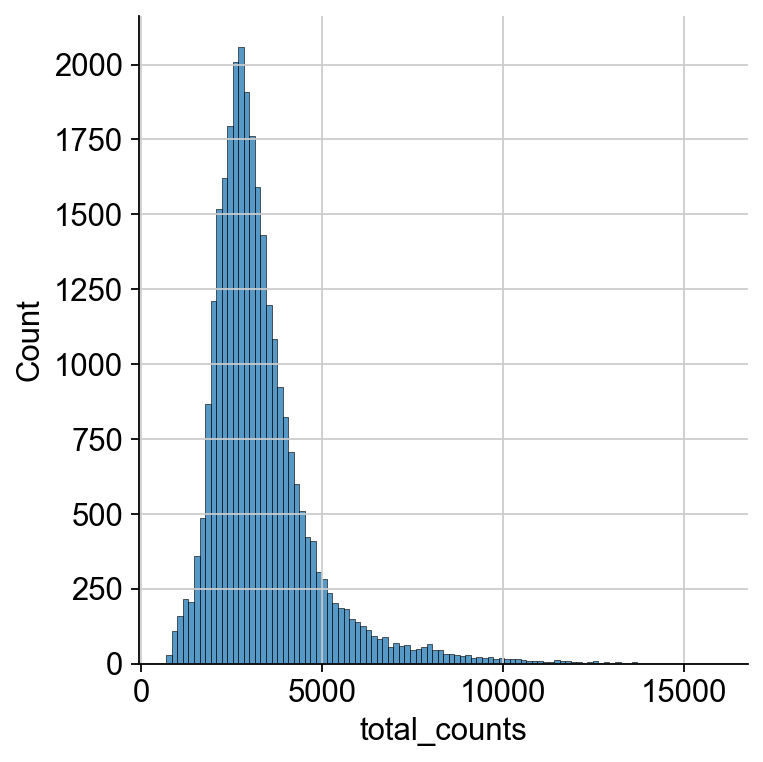

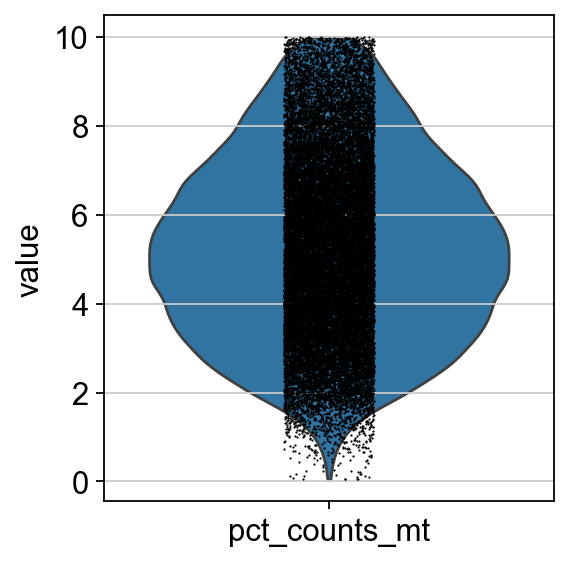

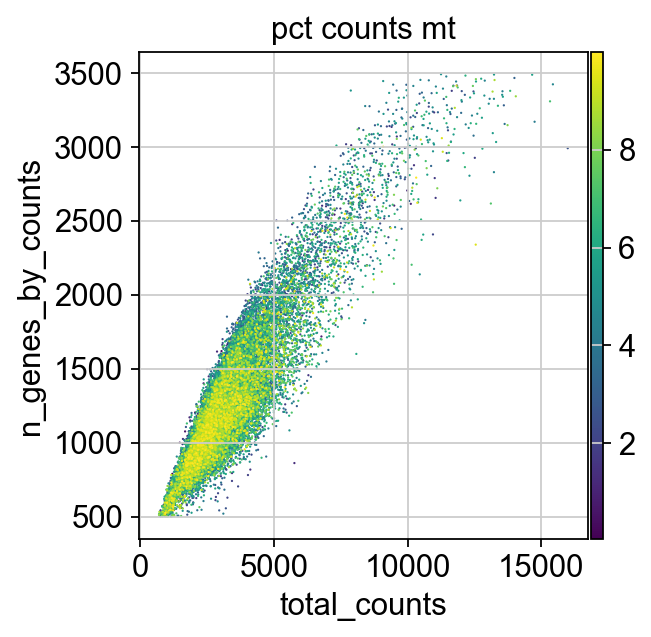

In [6]:
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

####looks lile pre=processing based on % mt counts has also been done

# Normalisation

In [7]:
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

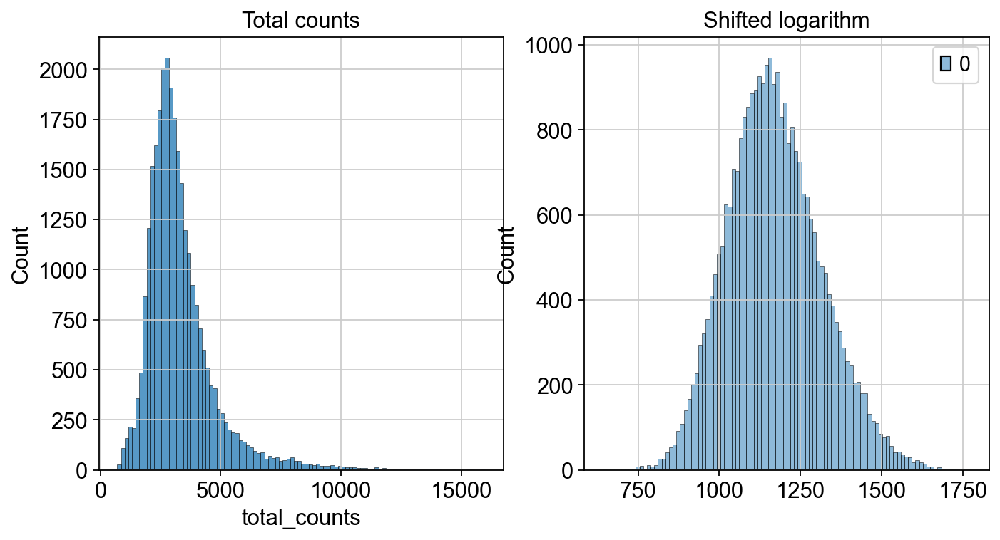

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs['total_counts'], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [9]:
from scipy.sparse import csr_matrix, issparse

In [10]:
%%R
library(scran)
library(BiocParallel)

Loading required package: SingleCellExperiment
Loading required package: SummarizedExperiment
Loading required package: MatrixGenerics
Loading required package: matrixStats

Attaching package: ‘MatrixGenerics’

The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOr

In [11]:
# Preliminary clustering for differentiated normalisation
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

/Users/alex/miniconda3/envs/scanpy_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/gv/57z5thfs7kqfq2njhk1gg9jc0000gn/T/ipykernel_78226/2214793430.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_pp, key_added="groups")


In [12]:
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [13]:
del adata_pp

In [14]:
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

In [15]:
adata.obs["size_factors"] = size_factors
scran = adata.X / adata.obs["size_factors"].values[:, None]
adata.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

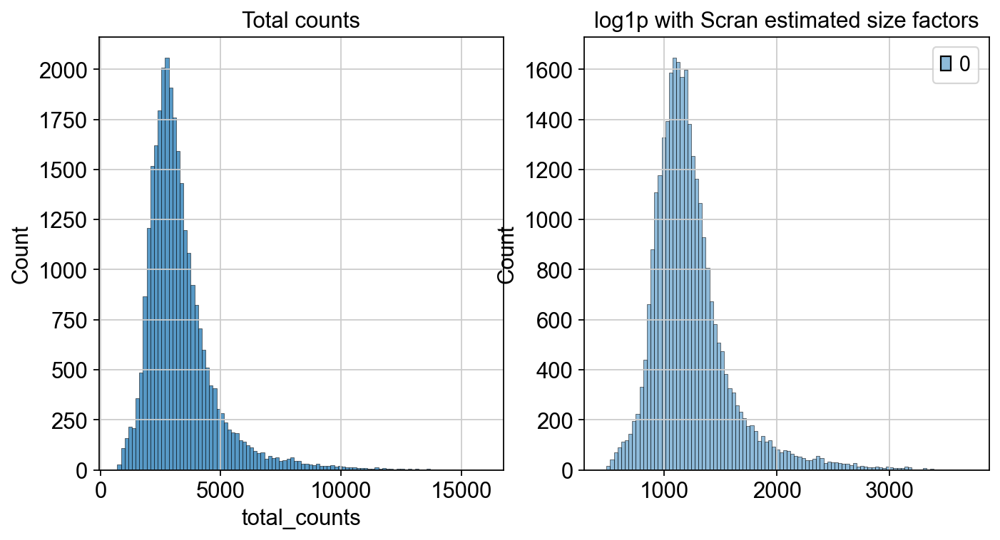

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["scran_normalization"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("log1p with Scran estimated size factors")
plt.show()

# Feature selection

currently generate both highly variable (on log1pnorm counts) and highly deviant on raw counts.

In [17]:
%%R -i adata
library(scry)

In [18]:
ro.globalenv["adata"] = adata

In [19]:
%%R
sce = devianceFeatureSelection(adata, assay="X")

In [20]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

In [21]:
idx = binomial_deviance.argsort()[-8000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

adata

AnnData object with n_obs × n_vars = 29182 × 25815
    obs: 'cell_ids', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance'
    layers: 'counts', 'log1p_norm', 'scran_normalization'

In [22]:
sc.pp.highly_variable_genes(adata, layer="log1p_norm")
adata

AnnData object with n_obs × n_vars = 29182 × 25815
    obs: 'cell_ids', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'size_factors'
    var: 'gene_symbols', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_deviant', 'binomial_deviance', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'counts', 'log1p_norm', 'scran_normalization'

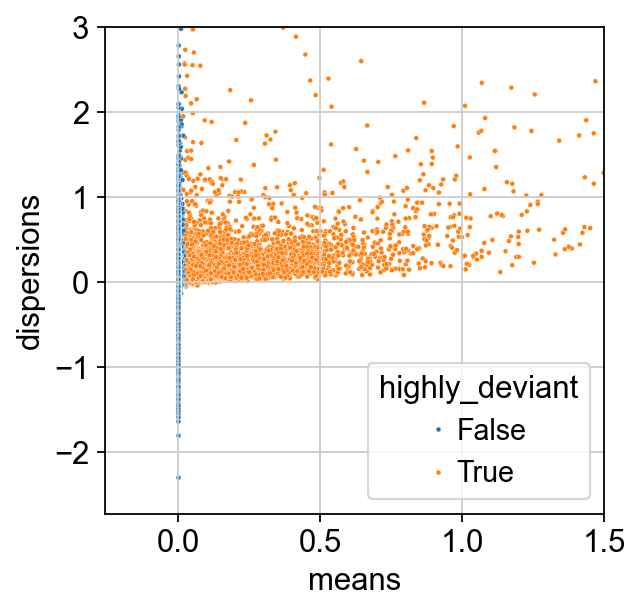

In [23]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_deviant", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

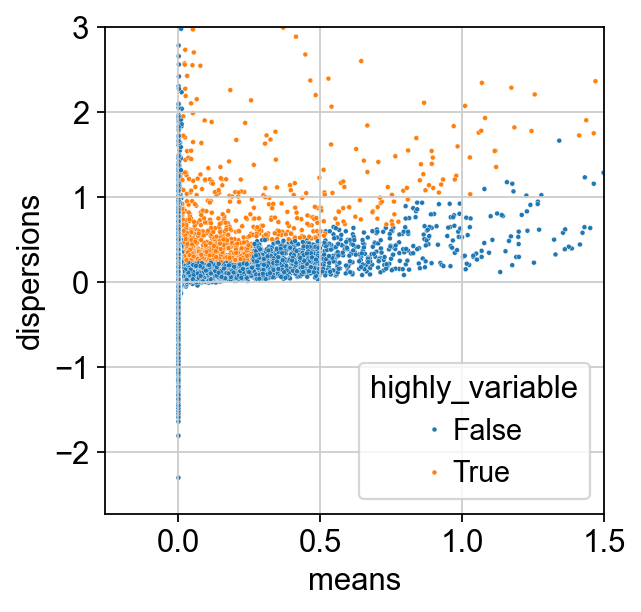

In [24]:
ax = sns.scatterplot(
    data=adata.var, x="means", y="dispersions", hue="highly_variable", s=5
)
ax.set_xlim(None, 1.5)
ax.set_ylim(None, 3)
plt.show()

# DIM reduction

Based on highly deviant

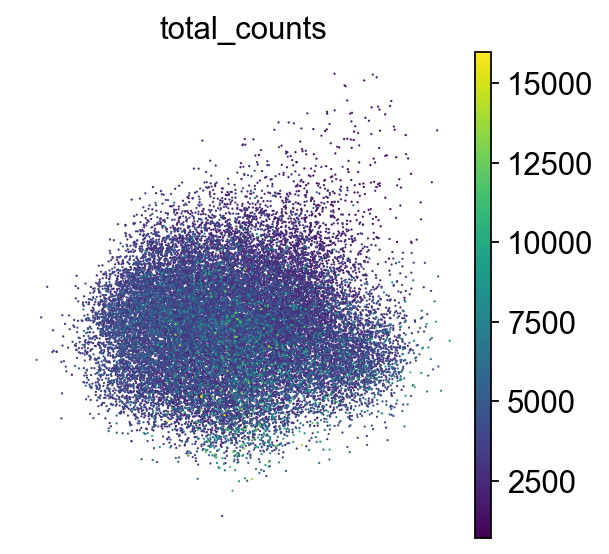

In [25]:
## Choose normalisation

sc.pp.pca(adata, layer = "log1p_norm", svd_solver="arpack", mask_var = "highly_deviant")
#sc.pp.pca(adata, layer = "scran_normalization", svd_solver="arpack", mask_var = "highly_deviant")

sc.pl.pca_scatter(adata, color="total_counts")

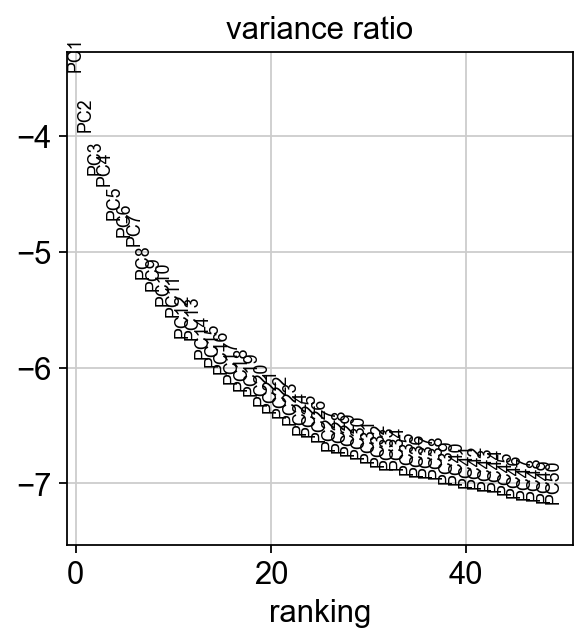

In [26]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

Based on highly variable

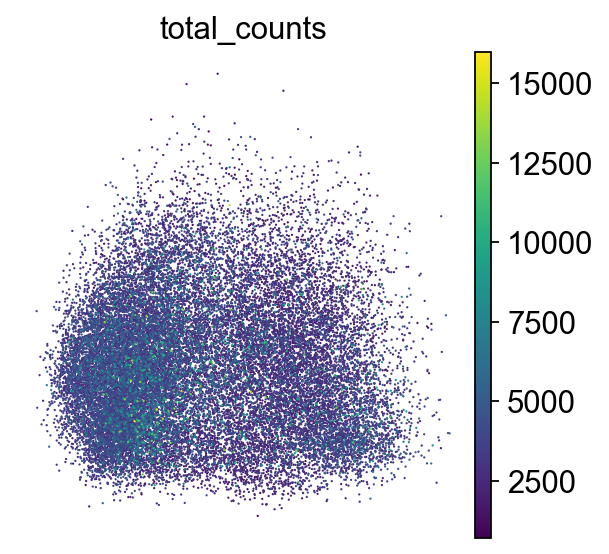

In [27]:
#Log 1p achieved much better separation here
sc.pp.pca(adata, layer = "log1p_norm", svd_solver="arpack", mask_var = "highly_variable")

#sc.pp.pca(adata, layer = "scran_normalization", svd_solver="arpack", mask_var = "highly_variable")
sc.pl.pca_scatter(adata, color="total_counts")

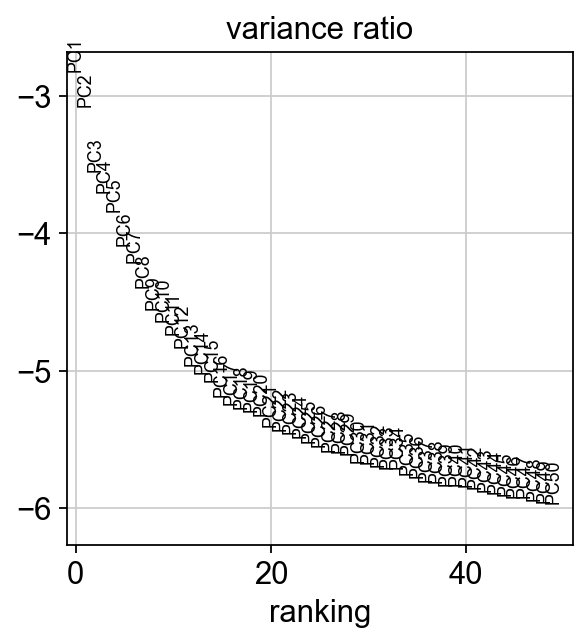

In [28]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

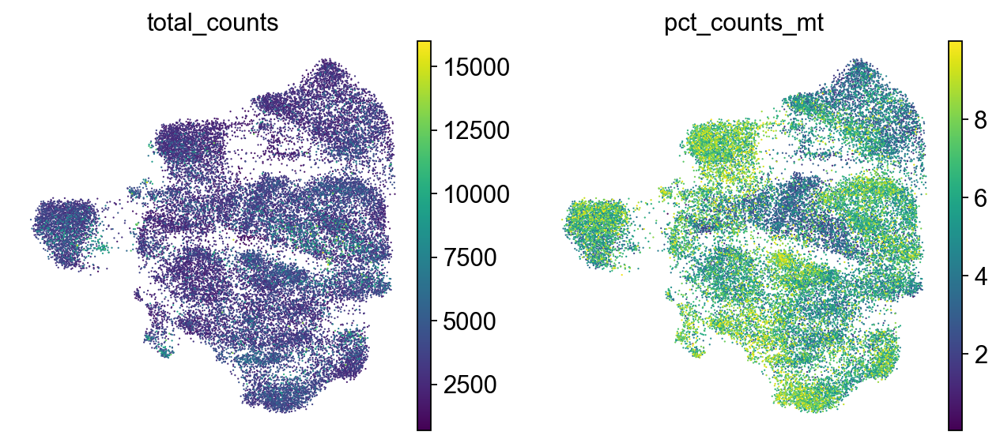

In [29]:
#50 vs 20 relatively similar (on UMAP) - went with 50 due to apparently low conseuqence of using too many

sc.pp.neighbors(adata, n_pcs=50)
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt"],
)

# Clustering

In [30]:
# calcualted off PC space defined in DIM reduction above - highly variable/deviant and type of normalisation are defined there

sc.pp.neighbors(adata, n_pcs=50)
sc.tl.umap(adata)

In [31]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_4", resolution=0.4)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res0_6", resolution=0.6)
sc.tl.leiden(adata, key_added="leiden_res0_7", resolution=0.7)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

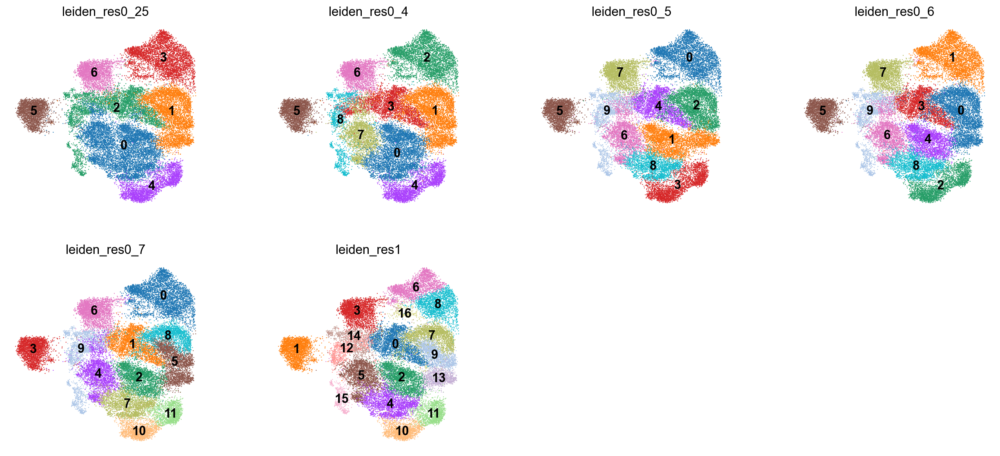

In [32]:
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_4", "leiden_res0_5", "leiden_res0_6", "leiden_res0_7","leiden_res1"],
    legend_loc="on data", 
)

# visually hard to tell how many clusters make sense, data paper found 6 using their DEG metric, will use DEG chart and dendrograms to inform

# Annotation

In [33]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist ## don't use in final
from celltypist import models

import urllib.request

In [34]:
marker_genes = {
    "T-cell": ["CD3D", "IL7R", "CD2", "TRBC2", "TRBC1", "IL32"],
    "NK" : ["GNLY", "NKG7", "GZMB", "KLRD1", "PRF1", "GZMA"],
    "B-cell": ["MS4A1", "HLA-DRA", "BANK1", "CD79A", "CD83", "HLA-DQB1"],
    "Fibroblast": ["DCN", "CFD", "FBLN1", "LUM", "COL3A1", "COL1A2"],
    "Endothelial": ["PECAM1", "ACKR1", "TM4SF1", "AQP1", "IFI27", "EMP1", "CLDN5"],
    "Plasmablast": ["IGKC", "IGLC3", "IGLC2", "IGHA1", "IGHG4", "IGHG3"],
    "Myeloid": ["LYZ", "S100A9", "CXCL8", "IL1B", "S100A8", "EREG"],
    "Mast": ["TPSAB1", "TPSB2", "CPA3", "LTC4S", "MS4A2", "HDC"],
    "Myofibroblast": ["RGS5", "TAGLN", "MT1A", "MT1M", "C11orf96"],
    "Epithelial": ["EPCAM", "KRT8", "ELF3", "AGR2", "KRT19", "CLDN4", "KRT18"],
    "Adenocarcinoma": ['MUC1', "AGR2"],
    "Epithelia-Stem":['KRT15', "COL17A1"],
    "Cycling": ["MKI67", "STMN1", "TYMS", "TOP2A", "PCLAF", "CENPF", "ITGAE", "ENTPD1"],
    "Paper-Clusters": ["ATP5F1E", "PLCG2", "CSKMT", "S100A2", "PIGR", "MUC1", "GAPDH"]

}

In [35]:
### Makes sure genes abbove are only included if present in our dataset
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [36]:
# Create cell type groups for dot plots below - from marker_genes defined above
Cell_types = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in list(marker_genes.keys())
}

In [37]:
Cell_types

{'T-cell': ['CD3D', 'IL7R', 'CD2', 'TRBC2', 'TRBC1', 'IL32'],
 'NK': ['GNLY', 'NKG7', 'GZMB', 'KLRD1', 'PRF1', 'GZMA'],
 'B-cell': ['MS4A1', 'HLA-DRA', 'BANK1', 'CD79A', 'CD83', 'HLA-DQB1'],
 'Fibroblast': ['DCN', 'CFD', 'FBLN1', 'LUM', 'COL3A1', 'COL1A2'],
 'Endothelial': ['PECAM1',
  'ACKR1',
  'TM4SF1',
  'AQP1',
  'IFI27',
  'EMP1',
  'CLDN5'],
 'Plasmablast': ['IGKC', 'IGLC3', 'IGLC2', 'IGHA1', 'IGHG4', 'IGHG3'],
 'Myeloid': ['LYZ', 'S100A9', 'CXCL8', 'IL1B', 'S100A8', 'EREG'],
 'Mast': ['TPSAB1', 'TPSB2', 'CPA3', 'LTC4S', 'MS4A2', 'HDC'],
 'Myofibroblast': ['RGS5', 'TAGLN', 'MT1A', 'MT1M', 'C11orf96'],
 'Epithelial': ['EPCAM', 'KRT8', 'ELF3', 'AGR2', 'KRT19', 'CLDN4', 'KRT18'],
 'Adenocarcinoma': ['MUC1', 'AGR2'],
 'Epithelia-Stem': ['KRT15', 'COL17A1'],
 'Cycling': ['MKI67',
  'STMN1',
  'TYMS',
  'TOP2A',
  'PCLAF',
  'CENPF',
  'ITGAE',
  'ENTPD1'],
 'Paper-Clusters': ['ATP5F1E',
  'PLCG2',
  'CSKMT',
  'S100A2',
  'PIGR',
  'MUC1',
  'GAPDH']}

In [38]:
list(adata.uns)

['hvg',
 'pca',
 'neighbors',
 'umap',
 'leiden_res0_25',
 'leiden_res0_4',
 'leiden_res0_5',
 'leiden_res0_6',
 'leiden_res0_7',
 'leiden_res1',
 'leiden_res0_25_colors',
 'leiden_res0_4_colors',
 'leiden_res0_5_colors',
 'leiden_res0_6_colors',
 'leiden_res0_7_colors',
 'leiden_res1_colors']

Once reach 07 res find a T-cell looking cluster - worth removing?
- once reach res of 1 no longer find - again no majour improvement in clustering for
- also find some clusters of cell with almost no epithelial marker expression -> worth removing these too? or not as point of clustering is to remove affects of high drop out rate

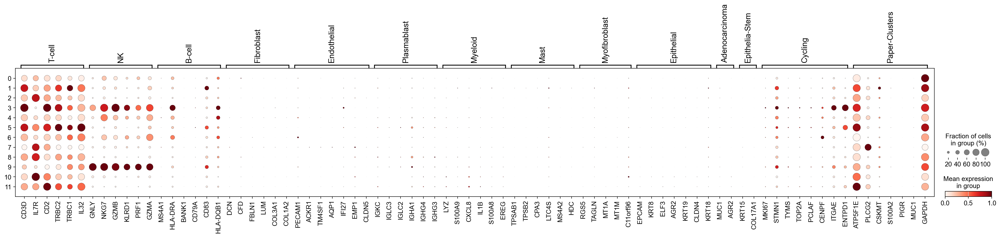

In [39]:
### Can vary my clustering resolution from here
sc.pl.dotplot(
    adata,
    groupby="leiden_res0_7",
    var_names=Cell_types,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

# Cluster-Specific DEG's as markers

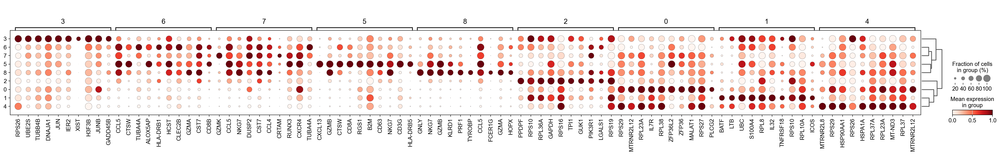

In [40]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res0_4", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_4", standard_scale="var"
)

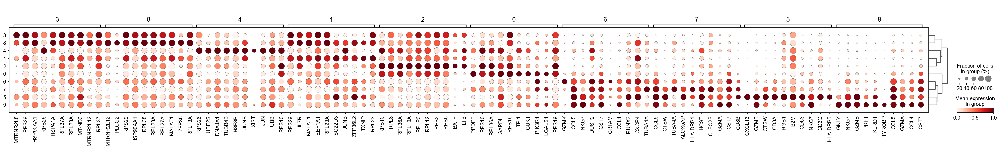

In [41]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res0_5", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_5", standard_scale="var"
)

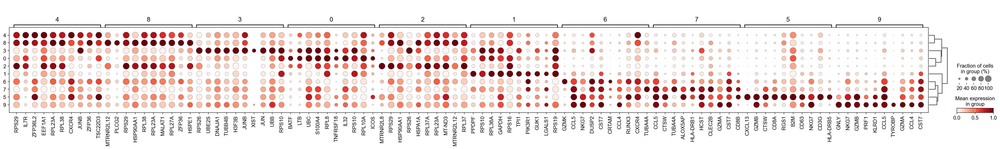

In [42]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res0_6", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_6", standard_scale="var"
)

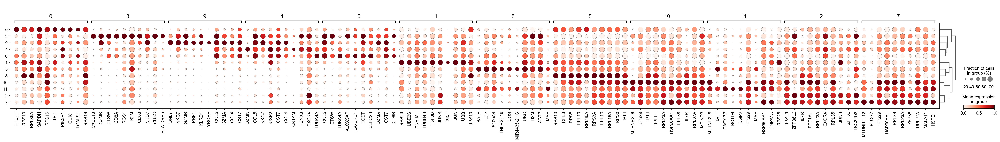

In [43]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res0_7", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res0_7", standard_scale="var"
)

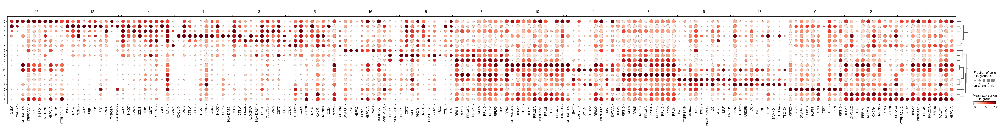

In [44]:
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(adata, groupby="leiden_res1", method="wilcoxon")

sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res1", standard_scale="var"
)

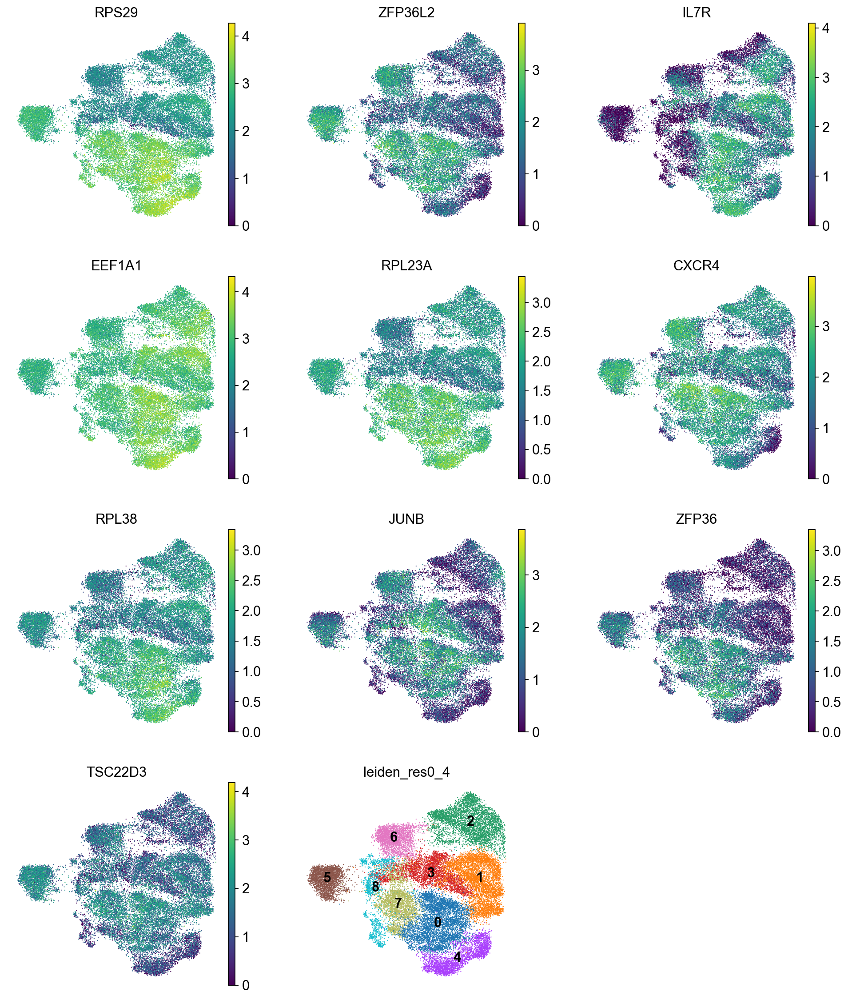

In [45]:
adata.X = adata.layers['log1p_norm']

dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="2").head(10)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, "leiden_res0_4"],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

## Cell-typist

In [46]:
import celltypist
from celltypist import models

In [47]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [48]:
## This is cell typist immune cell models - potentially the only ones relevant to this analysis
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json


📚 Total models in list: 54
📂 Storing models in /Users/alex/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [49]:
#high level = coarses annotation, low = finer annotation
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [50]:
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)
predictions_high_adata = predictions_high.to_adata()

🔬 Input data has 29182 cells and 25815 genes
🔗 Matching reference genes in the model
🧬 5908 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [51]:
#copies results to original adata object
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [52]:
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 29182 cells and 25815 genes
🔗 Matching reference genes in the model
🧬 5908 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 15
🗳️ Majority voting the predictions
✅ Majority voting done!


In [53]:
predictions_low_adata = predictions_low.to_adata()

In [54]:
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

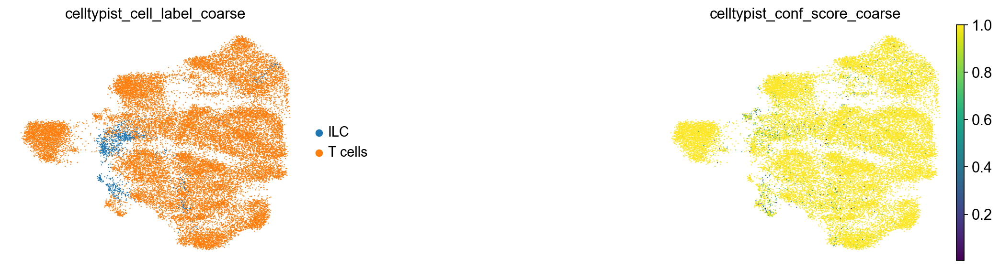

In [55]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

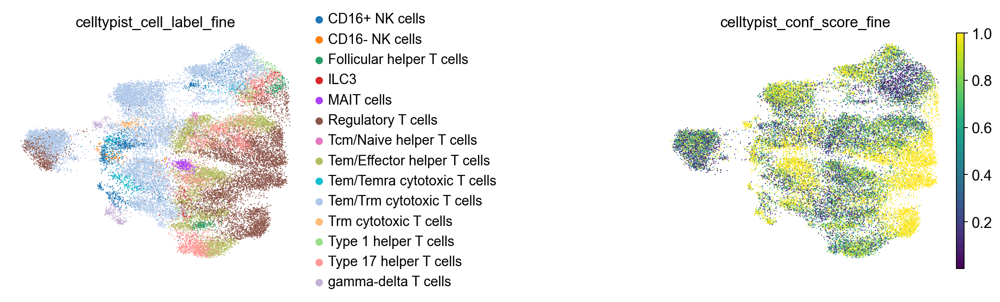

In [56]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

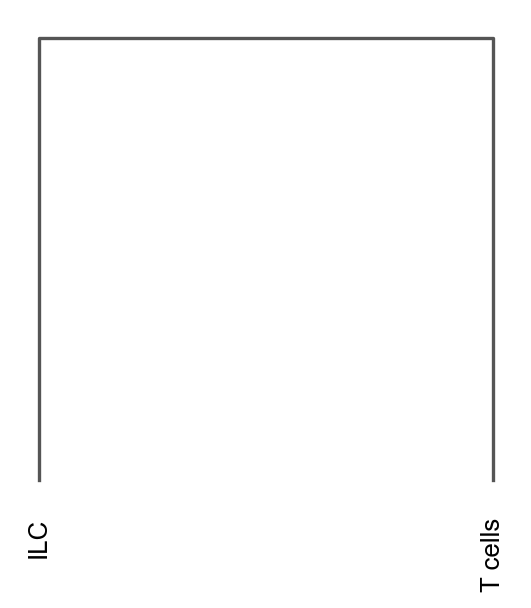

<Axes: >

In [57]:
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_coarse")

In [58]:
pd.crosstab(adata.obs.leiden_res0_4, adata.obs.celltypist_cell_label_coarse)

celltypist_cell_label_coarse,ILC,T cells
leiden_res0_4,,
0,98,4912
1,16,4711
2,69,4262
3,388,3011
4,13,2741
5,1,2583
6,1,2537
7,4,2519
8,584,732


In [59]:
pd.crosstab(adata.obs.leiden_res0_4, adata.obs.celltypist_cell_label_fine)

celltypist_cell_label_fine,CD16+ NK cells,CD16- NK cells,Follicular helper T cells,ILC3,MAIT cells,Regulatory T cells,Tcm/Naive helper T cells,Tem/Effector helper T cells,Tem/Temra cytotoxic T cells,Tem/Trm cytotoxic T cells,Trm cytotoxic T cells,Type 1 helper T cells,Type 17 helper T cells,gamma-delta T cells
leiden_res0_4,,,,,,,,,,,,,,
0,37,5,205,93,297,1315,0,1920,1,692,0,0,444,1
1,0,0,2,16,1,2814,0,931,1,88,2,0,869,3
2,196,1,212,68,0,429,0,168,95,2455,0,113,594,0
3,382,8,0,0,0,776,75,925,0,836,2,0,393,2
4,4,0,1,9,0,1284,0,603,0,7,0,0,846,0
5,0,1,0,0,0,751,0,0,1,1828,1,0,1,1
6,3,0,0,0,0,14,0,1,3,2510,5,0,1,1
7,12,4,0,0,1,14,0,11,198,2241,1,0,40,1
8,515,107,0,0,0,0,0,0,104,114,135,0,1,340


In [60]:
adata.obs

,cell_ids,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,leiden_res0_25,leiden_res0_4,leiden_res0_5,leiden_res0_6,leiden_res0_7,leiden_res1,celltypist_cell_label_coarse,celltypist_conf_score_coarse,celltypist_cell_label_fine,celltypist_conf_score_fine
0,AAACCCAAGGAGACCT.1_1,991,6.899723,2137.550079,7.667883,23.223806,129.347045,4.870200,6.051182,464.830622,...,3,2,0,1,0,6,T cells,0.999822,Tem/Trm cytotoxic T cells,0.581142
1,AAACCCAGTAGACAGC.1_1,1063,6.969791,2463.403303,7.809705,25.481414,82.080362,4.419808,3.331990,563.164042,...,3,2,0,1,0,8,T cells,0.999958,Tem/Trm cytotoxic T cells,0.148086
2,AAACCCAGTAGATCGG.1_1,855,6.752270,1977.452999,7.590071,24.171916,85.549155,4.460713,4.326229,695.239084,...,3,2,0,1,0,6,T cells,0.992753,Tem/Trm cytotoxic T cells,0.904075
4,AAACCCAGTTGGAGGT.1_1,959,6.866933,2419.105328,7.791566,24.353051,106.099787,4.673761,4.385910,739.824364,...,3,2,0,1,0,8,T cells,0.999998,Regulatory T cells,0.999805
5,AAACGAAAGACTCAAA.1_1,547,6.306275,1123.530083,7.025121,45.947375,112.114869,4.728404,9.978804,33.750684,...,3,2,0,1,0,8,T cells,0.967567,Regulatory T cells,0.271853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52373,TTTGGAGAGCGATTCT.1_10,963,6.871091,3438.371430,8.143044,29.534675,168.295430,5.131645,4.894626,1343.323386,...,0,0,8,8,7,4,T cells,0.999881,Tem/Effector helper T cells,0.619702
52376,TTTGGAGTCAGCGGAA.1_10,682,6.526495,2166.222995,7.681202,27.731552,90.243953,4.513537,4.165959,993.550445,...,0,0,8,8,7,4,T cells,0.991655,Regulatory T cells,0.609648
52382,TTTGGTTCATTGAAGA.1_10,1255,7.135687,3527.861251,8.168731,25.158171,295.897246,5.693386,8.387440,1060.847101,...,0,0,8,8,7,4,T cells,0.999986,Tem/Trm cytotoxic T cells,0.444073
52384,TTTGGTTGTTTGACAC.1_10,1517,7.325149,3130.374021,8.049227,22.209011,99.011432,4.605285,3.162927,385.055928,...,2,8,9,9,9,15,ILC,0.999992,CD16+ NK cells,0.999612


In [61]:
adata.obs['celltypist_cell_label_coarse'].value_counts()

T cells    28008
ILC         1174
Name: celltypist_cell_label_coarse, dtype: int64

In [62]:
adata.obs['celltypist_cell_label_fine'].value_counts()

Tem/Trm cytotoxic T cells      10771
Regulatory T cells              7397
Tem/Effector helper T cells     4559
Type 17 helper T cells          3189
CD16+ NK cells                  1149
Follicular helper T cells        420
Tem/Temra cytotoxic T cells      403
gamma-delta T cells              349
MAIT cells                       299
ILC3                             186
Trm cytotoxic T cells            146
CD16- NK cells                   126
Type 1 helper T cells            113
Tcm/Naive helper T cells          75
Name: celltypist_cell_label_fine, dtype: int64

# Write current progress

In [ ]:
adata.write("lymphT_adata.h5ad")

: 